# Color Jitter Notebook

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from color_jitter import *


In [2]:
# Load the Iris dataset
iris_df = sns.load_dataset('iris')

# Convert the 'cut' column to a categorical type with the specified order
iris_df['species'] = pd.Categorical(iris_df['species'])#, categories=cut_order, ordered=True)

# Display the first few rows to check it's loaded correctly
display(iris_df)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [3]:
# Define the Nightingale color palette in HEX
nightingale_palette = {
    'Bauhaus blue': '#2C5AA0',
    'Bauhaus red': '#F93F17',
    'Bauhaus yellow': '#FFED00',
    '70s orange': '#FF8E00',
    '70s pink': '#FFC5E5',
    'Modern green': '#5A7247',
    'Modern violet': '#926AA6',
    'Modern blue': '#7EBDC2',

}

# Define the Tableau 10 color palette in HEX
tableau_10_palette = {
    'blue': '#4E79A7',
    'orange': '#F28E2B',
    'green': '#59A14F',
    'red': '#E15759',
    'purple': '#B07AA1',
    'brown': '#9C755F',
    'pink': '#FABFD2',
    'gray': '#BAB0AC',
    'olive': '#8CD17D',
    'cyan': '#86BCB6',
}


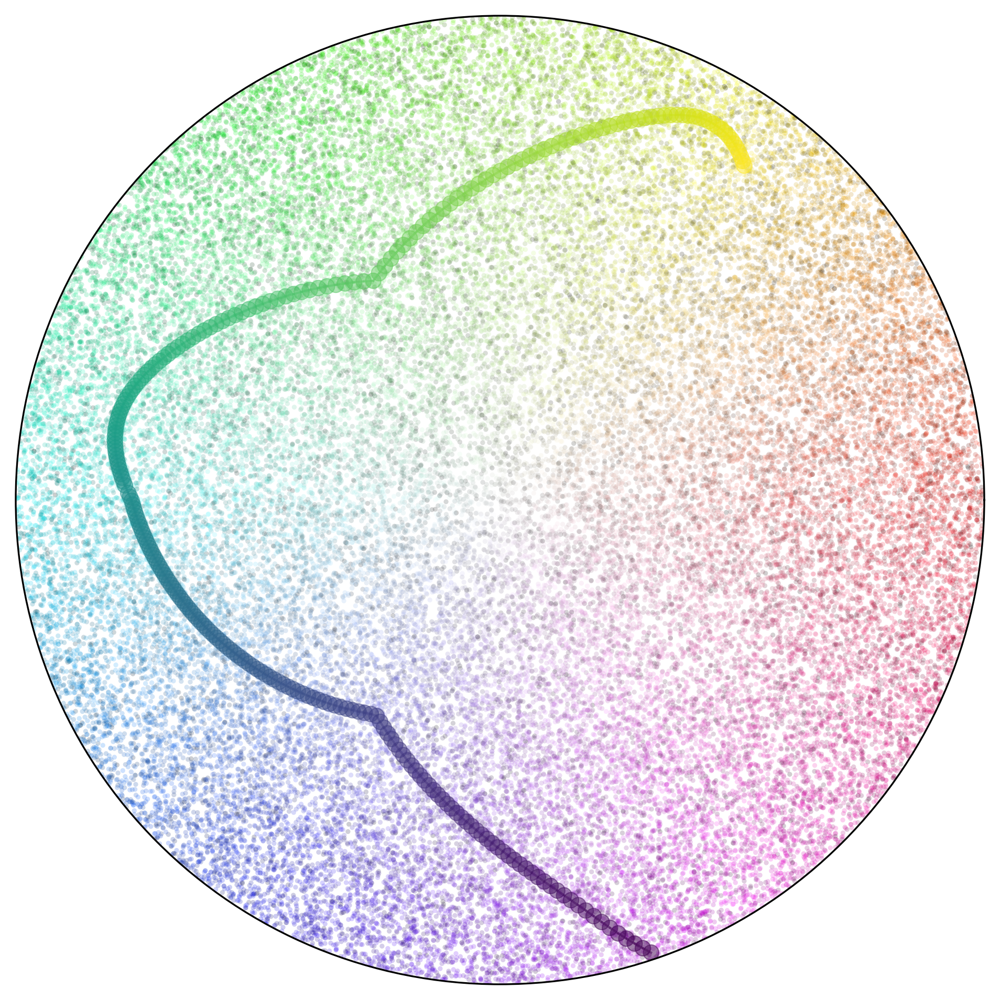

In [4]:

# Or call the function with a matplotlib colormap
color_wheel_plot(n_categories = 0, colormap=plt.cm.viridis, cmap_samples = 255)


# Visualize traditional, accepted jitter

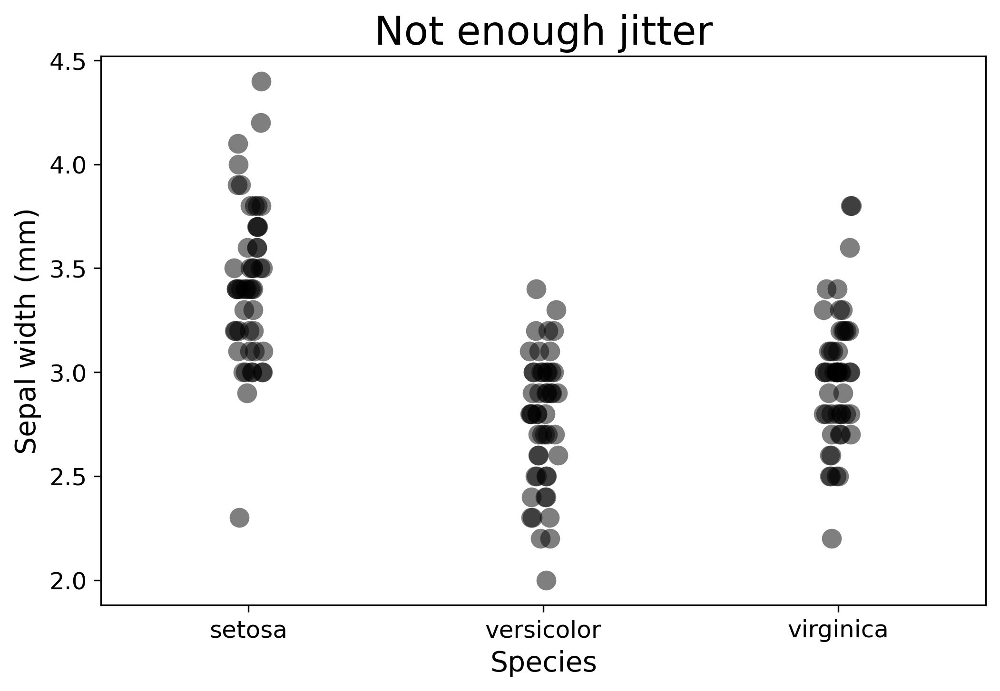

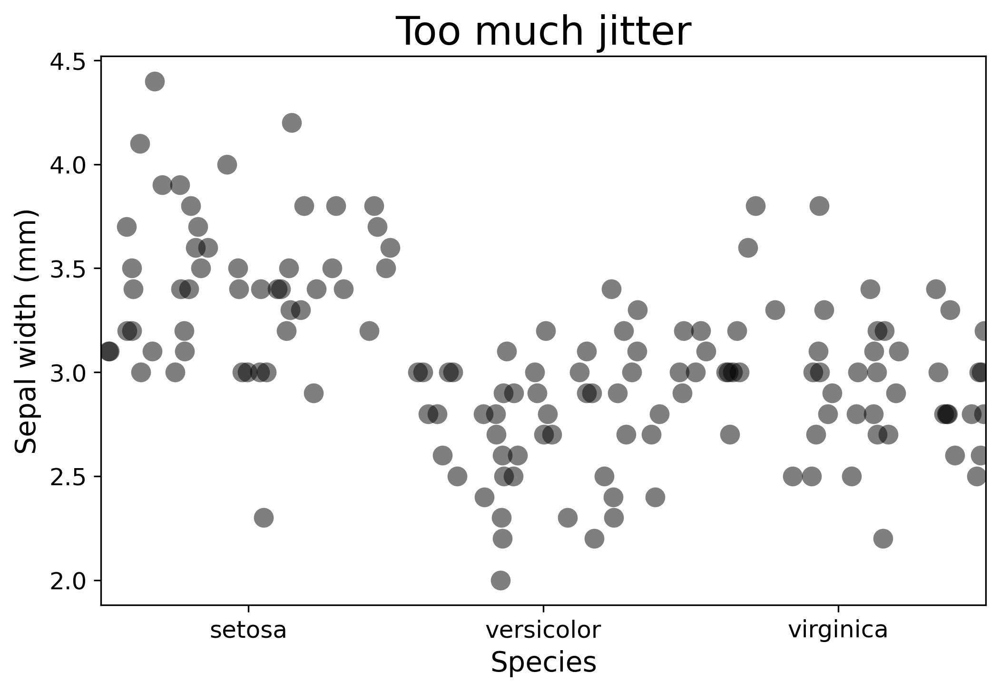

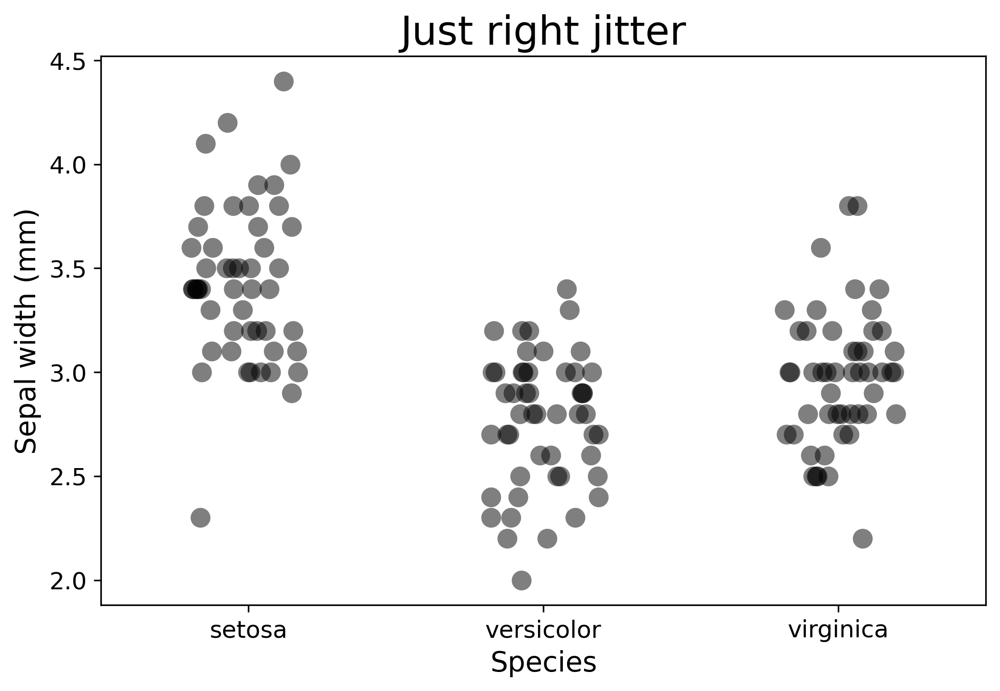

In [5]:
data_in = iris_df#iris_df
x_var = 'sepal_length'
y_var = 'sepal_width'
cat  = 'species'
point_size=20



data_in = iris_df  # Assuming iris_df is already loaded
x_var = 'sepal_length'
y_var = 'sepal_width'
cat = 'species'
point_size = 20

# Adjusting the size and titles for each plot
for jitter_val, title in zip([0.05, 0.5, 0.2], ['Not enough jitter', 'Too much jitter', 'Just right jitter']):
    plt.figure(figsize=(8, 5), dpi=300)
    sns.stripplot(x=cat, y=y_var, data=data_in, jitter=jitter_val, size=point_size/2, alpha=0.5, color='black')
    plt.title(title, fontsize=20)  # Adjusting the title font size
    plt.xlabel('Species', fontsize=14)  # Adjusting the x-axis label and font size
    plt.ylabel('Sepal width (mm)', fontsize=14)  # Adjusting the y-axis label and font size
    plt.xticks(fontsize=12)  # Adjusting the x-axis tick font size
    plt.yticks(fontsize=12)  # Adjusting the y-axis tick font size
    plt.show()


### Simulate additional points for the iris dataset to have overplotting

In [6]:
from scipy.stats import norm

# Number of points to generate for each species
N = 1000

# Initialize an empty DataFrame for the simulated data
iris_df_sim = pd.DataFrame()

# Iterate over each species to simulate data
for species in iris_df['species'].unique():
    species_group = iris_df[iris_df['species'] == species]
    sim_data = pd.DataFrame()
    
    # Iterate over each feature in the dataset
    for feature in ['sepal_length', 'sepal_width', 'petal_length', 'petal_width']:
        # Fit a normal distribution to the feature data of the current species
        mu, std = norm.fit(species_group[feature])
        # Simulate data from the distribution
        sim_data[feature] = norm.rvs(loc=mu, scale=std, size=N)
    
    # Add the species column
    sim_data['species'] = species
    
    # Append to the overall DataFrame
    iris_df_sim = pd.concat([iris_df_sim, sim_data])

# Reset the index of the final DataFrame
iris_df_sim = iris_df_sim.reset_index(drop=True)


In [7]:
data_in = iris_df_sim

In [8]:
# Assuming 'categories_in_data' is a list of your data's categories
categories_in_data = data_in[cat].unique()

# Extract the first N colors from the Nightingale palette
num_categories = len(categories_in_data)
selected_colors = list(nightingale_palette.values())[:num_categories]

# Build the new palette
category_palette = {category: color for category, color in zip(categories_in_data, selected_colors)}


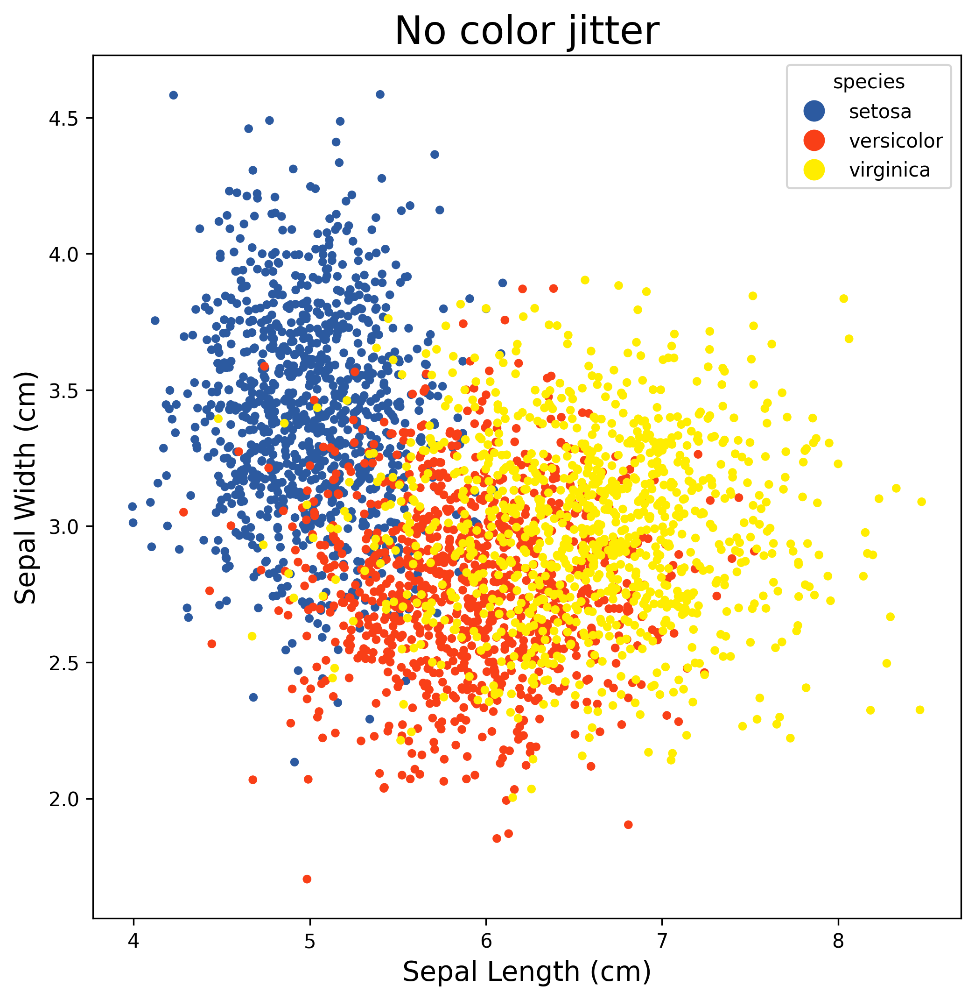

In [9]:
plot_title = 'No color jitter'
colorjitter_scatterplot(data_in, x_var, y_var, cat, jitter_intensity=0, point_size=point_size, opacity=1, 
                        custom_palette=category_palette, plot_title=plot_title,
                        x_label='Sepal Length (cm)',
                        y_label='Sepal Width (cm)')




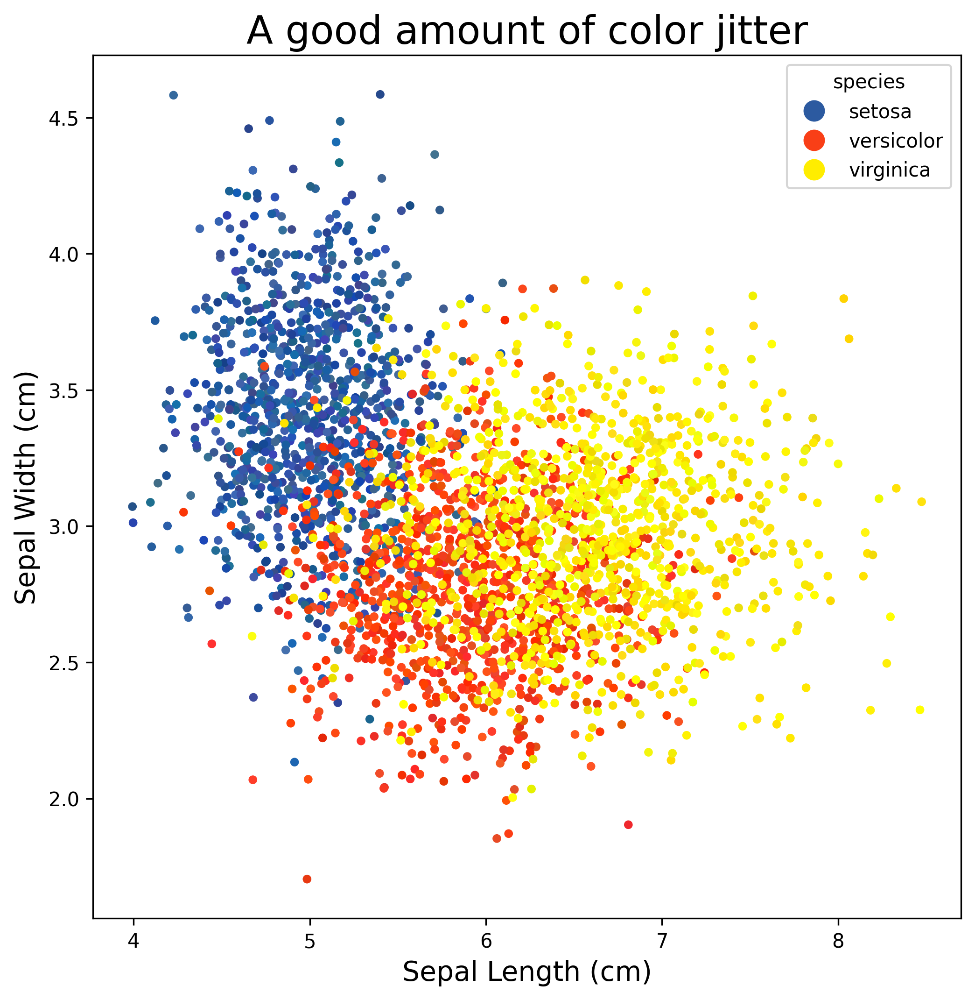

In [10]:
plot_title = 'A good amount of color jitter'
colorjitter_scatterplot(data_in, x_var, y_var, cat, jitter_intensity=0.1, point_size=point_size, opacity=1, 
                        custom_palette=category_palette, plot_title=plot_title,
                        x_label='Sepal Length (cm)',
                        y_label='Sepal Width (cm)')

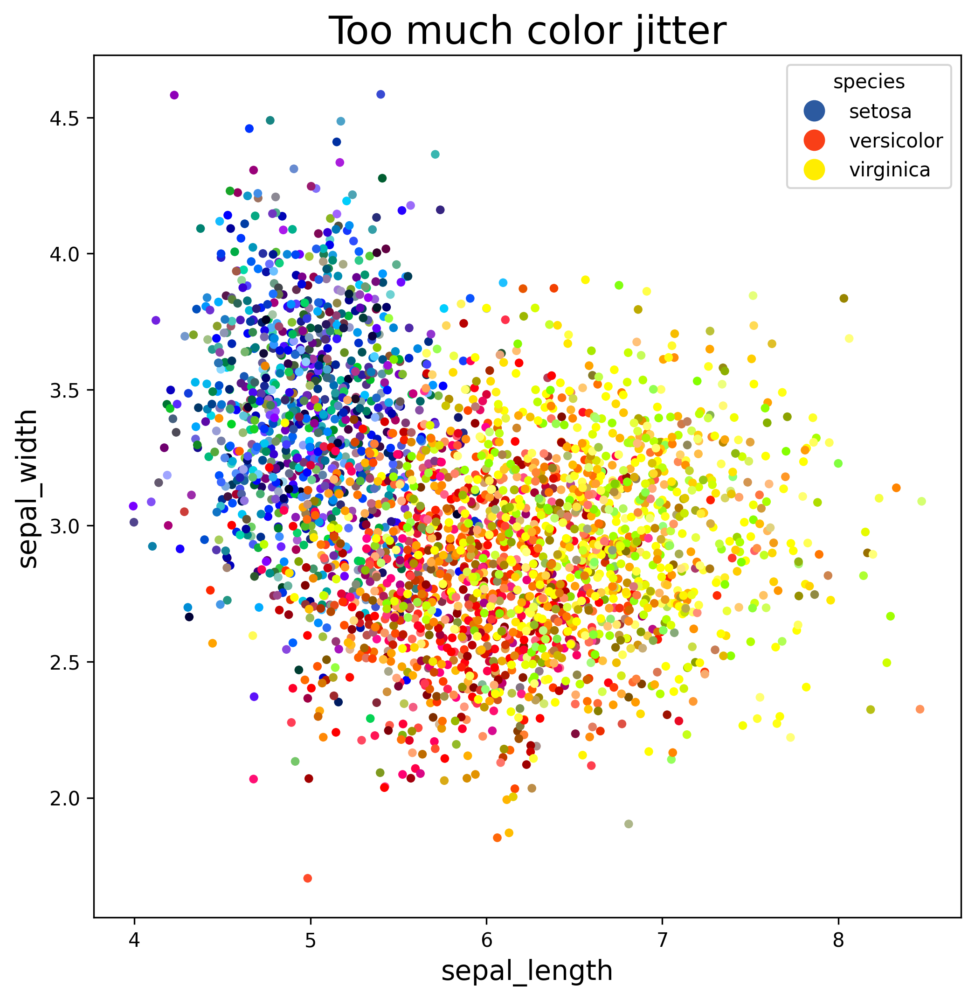

In [11]:
plot_title = 'Too much color jitter'
colorjitter_scatterplot(data_in, x_var, y_var, cat, jitter_intensity=0.5, point_size=point_size, opacity=1, custom_palette=category_palette, plot_title=plot_title)

# jitter_intensity=0.1

# Color wheel plots with color jitter

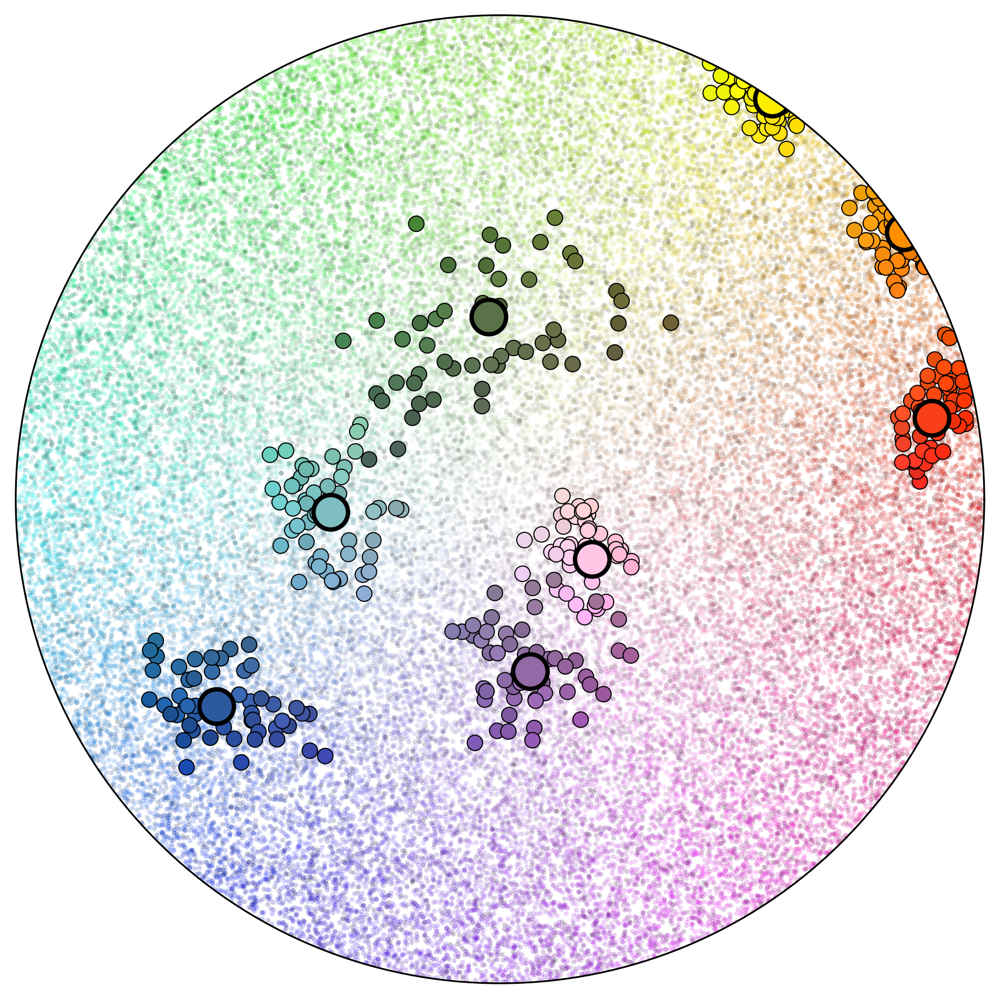

In [12]:
color_wheel_plot(n_categories=8, custom_palette=nightingale_palette, color_jitter=0.08)



In [ ]:

# Or call the function with a matplotlib colormap
color_wheel_plot(n_categories = 10, colormap=plt.cm.tab20c, color_jitter=0.1, cmap_samples = 0)


# Use distinctipy to generate distinctive color palettes, and experiment with increasing color jitter

In [ ]:
import distinctipy


In [ ]:
# Assuming the categories in your data are already defined, let's say like this:
categories_in_data = data_in[cat].unique()

# We generate distinct colors for each category
N = len(categories_in_data)  # Number of unique categories
colors = distinctipy.get_colors(N)

# Map them to hex
hex_colors = ['#' + ''.join(['{:02X}'.format(int(c * 255)) for c in color]) for color in colors]

# Now we map the generated colors back to the actual categories from the data
generated_palette = {category: hex_color for category, hex_color in zip(categories_in_data, hex_colors)}
color_jitter=0.3

color_wheel_plot(n_categories=N, custom_palette=generated_palette, color_jitter=color_jitter)


In [ ]:

# Now call the plotting function with the custom palette
plot_title = 'Generated palette'
colorjitter_scatterplot(data_in, x_var, y_var, cat, jitter_intensity=color_jitter, point_size=point_size, opacity=1, custom_palette=generated_palette, plot_title=plot_title)

